In [1]:
import os
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import tarfile
import random
import seaborn as sns
import PIL
from PIL import Image, ImageOps

In [2]:
tar_path = "lab3_data/training_images.tar"
extract_dir = "lab3_data/extracted_images"

os.makedirs(extract_dir, exist_ok=True)

image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif'}

with tarfile.open(tar_path, "r") as tar:
    tar.extractall(path=extract_dir)
    members = tar.getmembers()

print(f"Total files extracted: {len(members)}")

valid_files = []
for member in members:
    file_name = member.name
    if member.isdir():
        continue
    if os.path.basename(file_name).startswith('._'):
        continue
    _, ext = os.path.splitext(file_name)
    if ext.lower() in image_extensions:
        valid_files.append(file_name)

print(f"Number of valid image files: {len(valid_files)}")


/var/folders/yb/gm3s7q8j7rjchq61y16sy76c0000gn/T/ipykernel_62678/4072563893.py:9: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall(path=extract_dir)


Total files extracted: 123158
Number of valid image files: 61578


In [3]:
print(f"Total number of images in the training set: {len(valid_files)}")

Total number of images in the training set: 61578


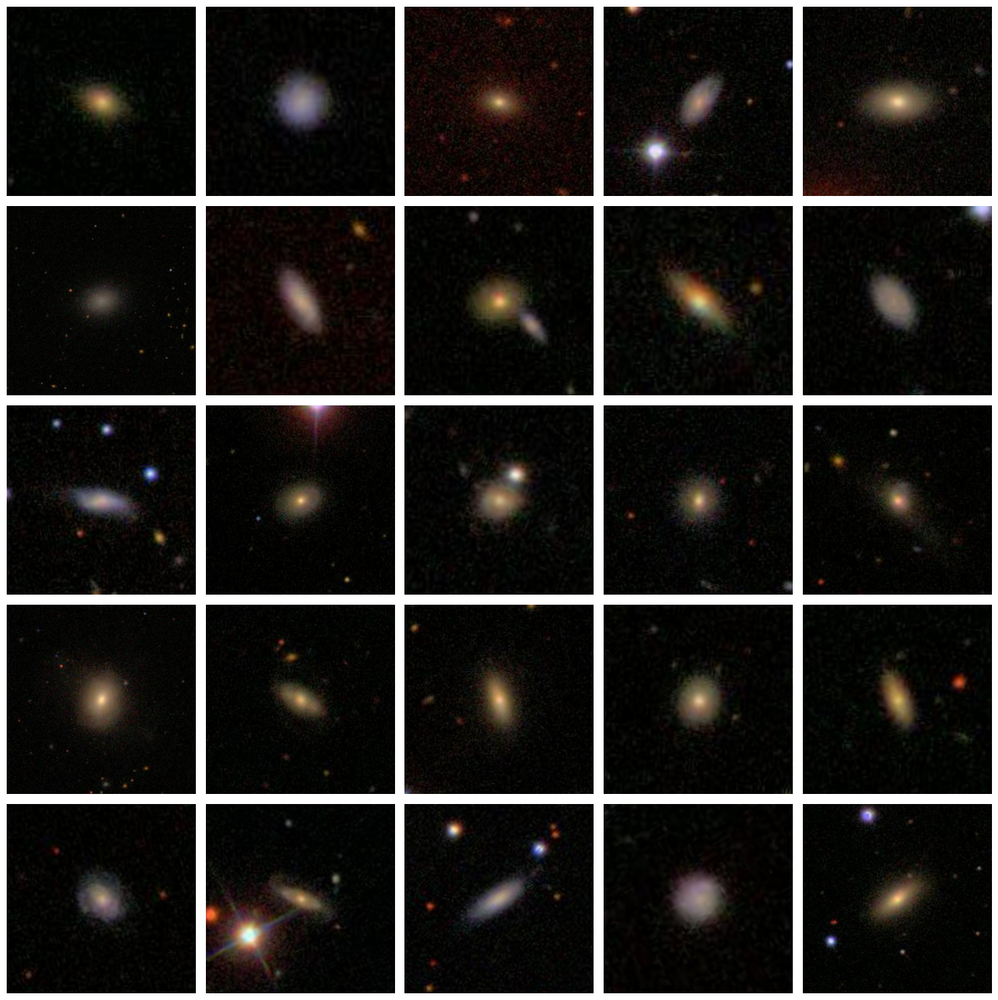

In [4]:
random_files = random.sample(valid_files, 25)
fig, axes = plt.subplots(5, 5, figsize=(15, 15))
axes = axes.flatten()

for img_path, ax in zip(random_files, axes):
    full_path = os.path.join(extract_dir, img_path)
    img = plt.imread(full_path)
    ax.imshow(img)
    ax.axis('off')

plt.tight_layout()
plt.show()


In [5]:
train_label_def = pd.read_csv("lab3_data/training_classifications.csv")
orig_cols = train_label_def.columns
cl_names = ["GalaxyID", "Smooth", "Features/Disk", "Star/Artifact", "Edge-On Disk", "Not Edge-On Disk",
            "Bar", "No Bar", "Spiral Arm", "No Spiral Arm", "No Bulge", "Barely Bulge",
            "Obvious Bulge", "Dominant Bulge", "Odd", "Not Odd", "Round", "Between", "Cigar",
            "Ring", "Lens/Arc", "Disturbed", "Irregular", "Other", "Merger", "Dust Lane", 
            "Rounded Bulge", "Boxy Bulge", "Still No Bulge", "Tight Spiral", "Medium Spiral", "Loose Spiral",
            "One Arm", "Two Arm", "Three Arm", "Four Arm", "More Than 4", "Unsure"]
train_labels = train_label_def
cl_label = [i for i in train_labels.columns if f"Galaxy" not in i]
train_labels.columns = cl_names
train_labels

,GalaxyID,Smooth,Features/Disk,Star/Artifact,Edge-On Disk,Not Edge-On Disk,Bar,No Bar,Spiral Arm,No Spiral Arm,...,Still No Bulge,Tight Spiral,Medium Spiral,Loose Spiral,One Arm,Two Arm,Three Arm,Four Arm,More Than 4,Unsure
0,100008,0.383147,0.616853,0.000000,0.000000,0.616853,0.038452,0.578401,0.418398,0.198455,...,0.000000,0.279952,0.138445,0.000000,0.000000,0.092886,0.000000,0.000000,0.0,0.325512
1,100023,0.327001,0.663777,0.009222,0.031178,0.632599,0.467370,0.165229,0.591328,0.041271,...,0.018764,0.000000,0.131378,0.459950,0.000000,0.591328,0.000000,0.000000,0.0,0.000000
2,100053,0.765717,0.177352,0.056931,0.000000,0.177352,0.000000,0.177352,0.000000,0.177352,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
3,100078,0.693377,0.238564,0.068059,0.000000,0.238564,0.109493,0.129071,0.189098,0.049466,...,0.000000,0.094549,0.000000,0.094549,0.189098,0.000000,0.000000,0.000000,0.0,0.000000
4,100090,0.933839,0.000000,0.066161,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61573,999948,0.510379,0.489621,0.000000,0.059207,0.430414,0.000000,0.430414,0.226257,0.204157,...,0.000000,0.226257,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.226257
61574,999950,0.901216,0.098784,0.000000,0.000000,0.098784,0.000000,0.098784,0.000000,0.098784,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
61575,999958,0.202841,0.777376,0.019783,0.116962,0.660414,0.067245,0.593168,0.140022,0.520391,...,0.000000,0.000000,0.090673,0.049349,0.000000,0.067726,0.000000,0.000000,0.0,0.072296
61576,999964,0.091000,0.909000,0.000000,0.045450,0.863550,0.022452,0.841098,0.795330,0.068220,...,0.000000,0.068398,0.318132,0.408799,0.227464,0.408799,0.090668,0.023065,0.0,0.045334


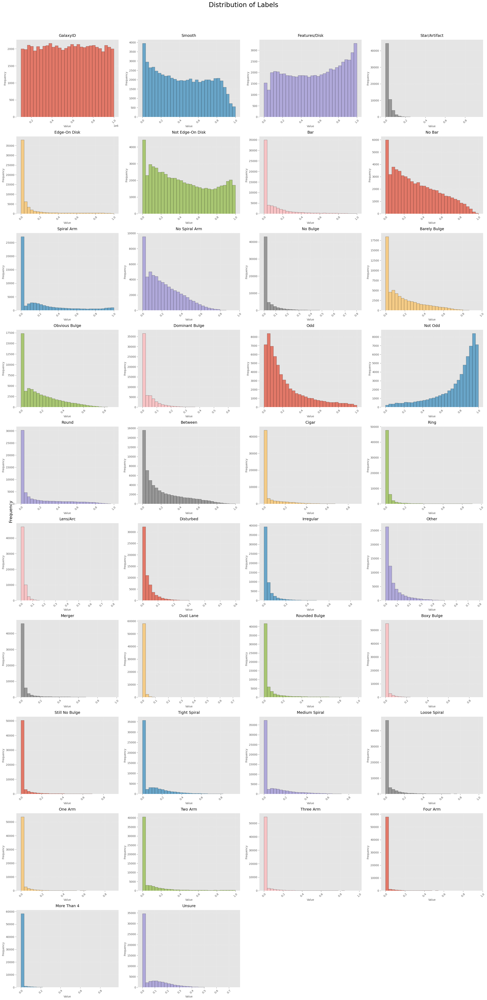

In [6]:
plt.style.use('ggplot') 
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
fig, ax = plt.subplots(10, 4, figsize=(25, 50))
fig.suptitle('Distribution of Labels', fontsize=24, y=1.02)
plt.subplots_adjust(hspace=0.4, wspace=0.3)

for i, label in enumerate(cl_names):
    ax_i = ax[i // 4, i % 4]
    ax_i.hist(train_labels[label], 
              bins=30, 
              color=colors[i % len(colors)],
              edgecolor='black', 
              alpha=0.7)
    
    ax_i.set_title(label, fontsize=14, pad=10)
    ax_i.set_xlabel('Value', fontsize=10)
    ax_i.set_ylabel('Frequency', fontsize=10)
    
    ax_i.grid(True, alpha=0.3, linestyle='--')
    

    ax_i.tick_params(axis='x', rotation=45)
    
    for spine in ax_i.spines.values():
        spine.set_linewidth(0.5)

for i in range(len(cl_names), 40):
    if i < 40:  
        ax[i // 4, i % 4].remove()

fig.text(0.5, 0.02, '', ha='center', fontsize=16)
fig.text(0.02, 0.5, 'Frequency', va='center', rotation='vertical', fontsize=16)

plt.tight_layout()

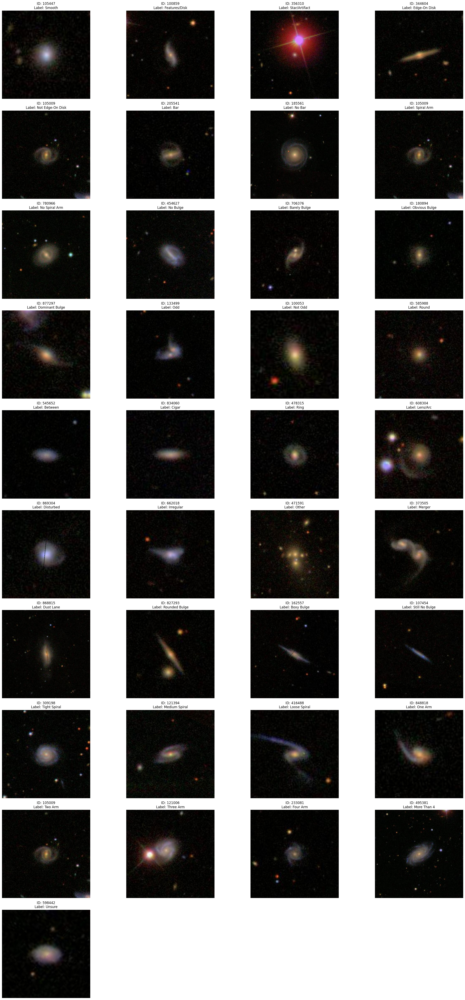

In [7]:
image_dir = os.path.join(extract_dir, 'training_images')

fig, ax = plt.subplots(10, 4, figsize=(25, 50))
for i, label in enumerate(cl_names[1:]):
    ax_i = ax[i // 4, i % 4]
    data = train_labels[["GalaxyID", label]]
    example_data = data[data[label] == data[label].max()].iloc[0]
    galaxy_id = int(example_data["GalaxyID"])
    image_path = os.path.join(image_dir, f"{galaxy_id}.jpg")
    image = np.array(Image.open(image_path))
    ax_i.imshow(image)
    ax_i.set_title(f"ID: {galaxy_id}\nLabel: {label}", fontsize=12)
    ax_i.axis('off')

        
total_plots = len(cl_names[1:])
for j in range(total_plots, 40):
    fig.delaxes(ax.flatten()[j])

plt.tight_layout()
plt.show()

<Axes: >

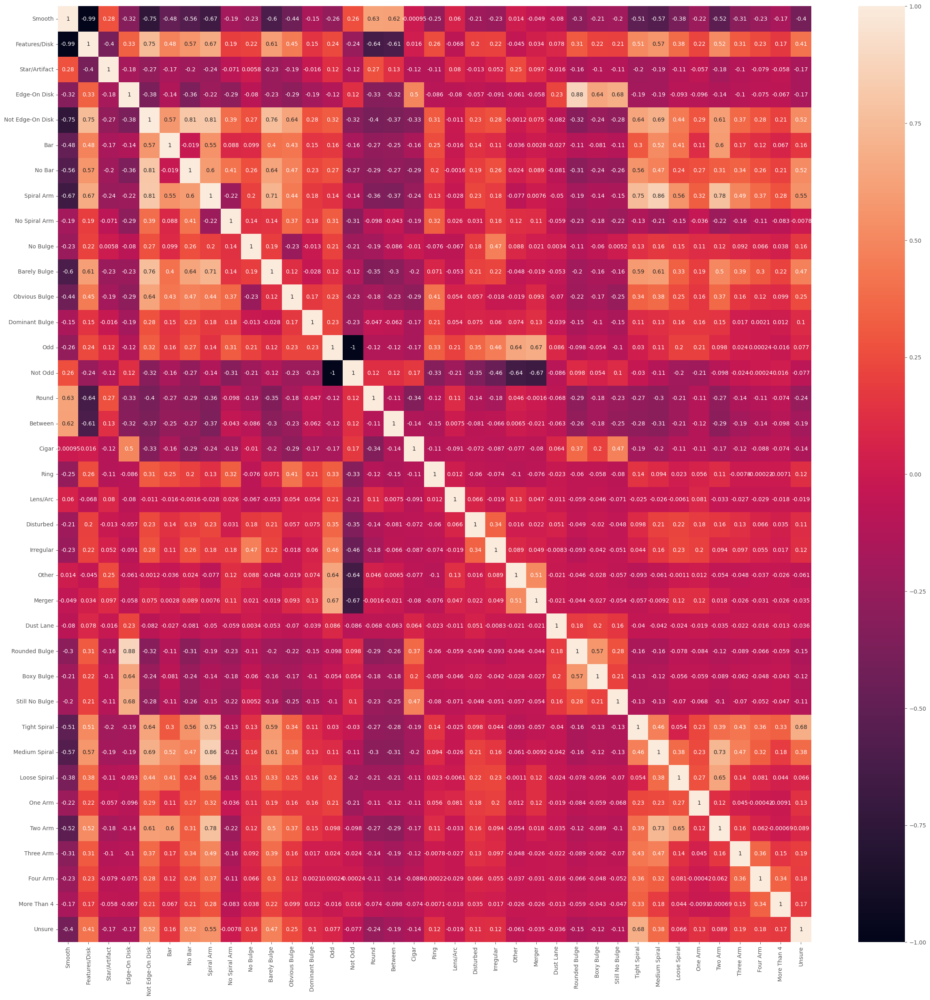

In [8]:
fig = plt.figure(figsize = (30, 30))
sns.heatmap(
        train_labels[cl_names[1:]].corr(),
        annot = True,
    )

In [9]:
output_dir = 'lab3_data/cropped_images'
os.makedirs(output_dir, exist_ok=True)

def downsize_images(input_files, input_dir, output_dir, crop_margin=120, output_size=(70, 70)):
    os.makedirs(output_dir, exist_ok=True)
    for file_name in input_files:
        input_path = os.path.join(input_dir, file_name)
        output_file_name = os.path.basename(file_name) 
        output_path = os.path.join(output_dir, output_file_name)
        try:
            with Image.open(input_path) as image:
                cropped = ImageOps.crop(image, crop_margin)
                resized = cropped.resize(output_size)
                resized.save(output_path)
        except Exception as e:
            print(f"Error processing {input_path}: {e}")

downsize_images(valid_files, extract_dir, output_dir)

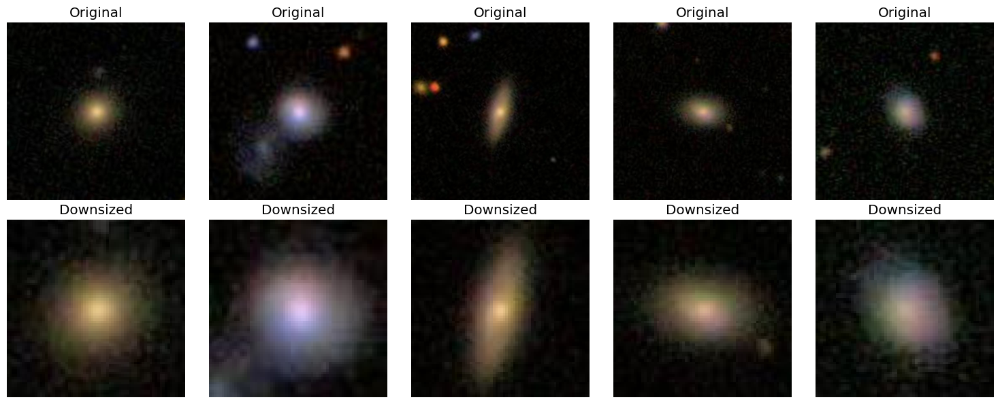

In [10]:
num_images = 5
random_files = random.sample(valid_files, num_images)

fig, axes = plt.subplots(2, num_images, figsize=(15, 6))

for idx, file_name in enumerate(random_files):
    orig_path = os.path.join(extract_dir, file_name)
    downsized_path = os.path.join(output_dir, os.path.basename(file_name))
    
    orig_image = Image.open(orig_path)
    downsized_image = Image.open(downsized_path)
    
    axes[0, idx].imshow(orig_image)
    axes[0, idx].set_title('Original')
    axes[0, idx].axis('off')
    axes[1, idx].imshow(downsized_image)
    axes[1, idx].set_title('Downsized')
    axes[1, idx].axis('off')

plt.tight_layout()
plt.show()

In [57]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import transforms, models
from PIL import Image
import pandas as pd
from sklearn.model_selection import train_test_split


In [20]:
train_labels['GalaxyID'] = train_labels['GalaxyID'].astype(str)
cropped_image_files = os.listdir('lab3_data/cropped_images')
available_image_ids = [os.path.splitext(f)[0] for f in cropped_image_files]
train_labels = train_labels[train_labels['GalaxyID'].isin(available_image_ids)].reset_index(drop=True)


In [21]:
# 2. Data Transforms
data_transforms = transforms.Compose([
    transforms.ToTensor(),
])

In [22]:
# 3. Split Data
train_df, val_df = train_test_split(
    train_labels,
    test_size=0.2,
    random_state=42
)

In [35]:
# 1. Compute mean labels from the training set (excluding 'GalaxyID')
mean_labels = train_df.drop('GalaxyID', axis=1).mean()
print("Mean labels computed from the training set:")
print(mean_labels)

# 2. Predict the mean labels for all images in both sets

# For the training set
train_predictions = np.tile(mean_labels.values, (len(train_df), 1))
train_actual = train_df.drop('GalaxyID', axis=1).values

# For the validation set
val_predictions = np.tile(mean_labels.values, (len(val_df), 1))
val_actual = val_df.drop('GalaxyID', axis=1).values

# 3. Calculate RMSE for the training set
train_mse = np.mean((train_predictions - train_actual) ** 2)
train_rmse = np.sqrt(train_mse)
print(f"\nTraining RMSE: {train_rmse:.4f}")

# 4. Calculate RMSE for the validation set
val_mse = np.mean((val_predictions - val_actual) ** 2)
val_rmse = np.sqrt(val_mse)
print(f"Validation RMSE: {val_rmse:.4f}")


Mean labels computed from the training set:
Smooth              0.433615
Features/Disk       0.541238
Star/Artifact       0.025148
Edge-On Disk        0.105988
Not Edge-On Disk    0.435250
Bar                 0.102744
No Bar              0.332506
Spiral Arm          0.215114
No Spiral Arm       0.220136
No Bulge            0.040744
Barely Bulge        0.179951
Obvious Bulge       0.177980
Dominant Bulge      0.036575
Odd                 0.231762
Not Odd             0.768238
Round               0.169956
Between             0.209014
Cigar               0.054645
Ring                0.034938
Lens/Arc            0.013431
Disturbed           0.032781
Irregular           0.040064
Other               0.064568
Merger              0.042103
Dust Lane           0.003878
Rounded Bulge       0.062720
Boxy Bulge          0.010501
Still No Bulge      0.032767
Tight Spiral        0.091426
Medium Spiral       0.083996
Loose Spiral        0.039692
One Arm             0.015363
Two Arm             0.094056

In [23]:
# 4. Define Custom Dataset
class GalaxyDataset(torch.utils.data.Dataset):
    def __init__(self, image_dir, labels_df, transform=None):
        self.image_dir = image_dir
        self.labels_df = labels_df
        self.transform = transform
        self.image_ids = self.labels_df['GalaxyID'].astype(str).tolist()
        self.labels = self.labels_df.drop('GalaxyID', axis=1).values
        
    def __len__(self):
        return len(self.labels_df)
    
    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        img_name = os.path.join(self.image_dir, f"{image_id}.jpg")
        image = Image.open(img_name).convert('RGB')
        label = self.labels[idx]
        if self.transform:
            image = self.transform(image)
        label = torch.tensor(label, dtype=torch.float32)
        return image, label


In [29]:
# 5. Create Datasets and DataLoaders
train_dataset = GalaxyDataset(
    image_dir='lab3_data/cropped_images',
    labels_df=train_df,
    transform=data_transforms
)

val_dataset = GalaxyDataset(
    image_dir='lab3_data/cropped_images',
    labels_df=val_df,
    transform=data_transforms
)

batch_size = 32

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0  # Set to 0
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=0  # Set to 0
)



In [30]:
# 6. Define the Model
class GalaxyClassifier(nn.Module):
    def __init__(self, num_labels):
        super(GalaxyClassifier, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
        )
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 8 * 8, 256),
            nn.ReLU(),
            nn.Linear(256, num_labels)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

num_labels = len(cl_names) - 1
model = GalaxyClassifier(num_labels=num_labels)


In [31]:
# 7. Set Up Loss Function and Optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)


In [92]:
# 8. Set Device
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
model.to(device)

GalaxyClassifier(
  (features): Sequential(
    (0): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=4096, out_features=256, bias=True)
    (2): ReLU()
    (3): Linear(in_features=256, out_features=37, bias=True)
  )
)

In [33]:
# 9. Training and Validation Loops
num_epochs = 10

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for batch_idx, (images, labels) in enumerate(train_loader):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        if (batch_idx + 1) % 10 == 0:
            print(f"Epoch [{epoch + 1}/{num_epochs}], Step [{batch_idx + 1}/{len(train_loader)}], Loss: {loss.item():.4f}")

    epoch_loss = running_loss / len(train_loader)
    print(f"Epoch [{epoch + 1}/{num_epochs}] Training Loss: {epoch_loss:.4f}")

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            
    avg_val_loss = val_loss / len(val_loader)
    print(f"Epoch [{epoch + 1}/{num_epochs}] Validation Loss: {avg_val_loss:.4f}")

    # Save the model checkpoint
    checkpoint_path = f'galaxy_classifier_epoch_{epoch + 1}.pth'
    torch.save(model.state_dict(), checkpoint_path)
    print(f"Model saved to {checkpoint_path}")


Epoch [1/10], Step [10/1540], Loss: 0.0370
Epoch [1/10], Step [20/1540], Loss: 0.0273
Epoch [1/10], Step [30/1540], Loss: 0.0288
Epoch [1/10], Step [40/1540], Loss: 0.0278
Epoch [1/10], Step [50/1540], Loss: 0.0300
Epoch [1/10], Step [60/1540], Loss: 0.0270
Epoch [1/10], Step [70/1540], Loss: 0.0291
Epoch [1/10], Step [80/1540], Loss: 0.0216
Epoch [1/10], Step [90/1540], Loss: 0.0317
Epoch [1/10], Step [100/1540], Loss: 0.0260
Epoch [1/10], Step [110/1540], Loss: 0.0258
Epoch [1/10], Step [120/1540], Loss: 0.0240
Epoch [1/10], Step [130/1540], Loss: 0.0242
Epoch [1/10], Step [140/1540], Loss: 0.0261
Epoch [1/10], Step [150/1540], Loss: 0.0224
Epoch [1/10], Step [160/1540], Loss: 0.0230
Epoch [1/10], Step [170/1540], Loss: 0.0236
Epoch [1/10], Step [180/1540], Loss: 0.0243
Epoch [1/10], Step [190/1540], Loss: 0.0250
Epoch [1/10], Step [200/1540], Loss: 0.0229
Epoch [1/10], Step [210/1540], Loss: 0.0171
Epoch [1/10], Step [220/1540], Loss: 0.0212
Epoch [1/10], Step [230/1540], Loss: 0.01

In [140]:
train_mse = np.array([0.0187, 0.0139, 0.0121, 0.0111, 0.0105, 0.0100, 0.0096, 0.0093, 0.0090, 0.0086])
val_mse = np.array([0.0153, 0.0128, 0.0120, 0.0116, 0.0108, 0.0105, 0.0106, 0.0106, 0.0105, 0.0109])

In [141]:
train_losses_custom_cnn = np.sqrt(train_mse)
val_losses_custom_cnn = np.sqrt(val_mse)

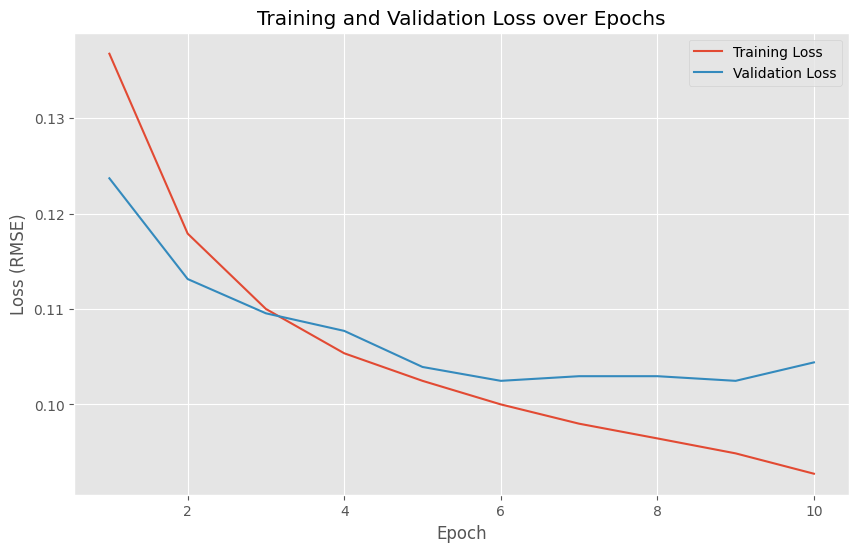

In [142]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), train_losses_custom_cnn, label='Training Loss')
plt.plot(range(1, num_epochs + 1), val_losses_custom_cnn, label='Validation Loss')
plt.title('Training and Validation Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss (RMSE)')
plt.legend()
plt.grid(True)
plt.show()

In [124]:
print(f"Validation RMSE (CNN): {np.min(val_losses):.2f}")

Validation RMSE (CNN): 0.10



## Input Layer
The network accepts images of shape `(3, 70, 70)`, corresponding to RGB images resized to 70x70 pixels.

---

## Convolutional Layers

### **First Convolutional Layer**
- **Input Channels:** 3 (RGB images)
- **Output Channels:** 16
- **Kernel Size:** 3x3
- **Padding:** 1 (to maintain spatial dimensions)
- **Activation:** ReLU (Rectified Linear Unit)
- **Max Pooling:** 2x2 window, reducing spatial dimensions by half.

### **Second Convolutional Layer**
- **Input Channels:** 16
- **Output Channels:** 32
- **Kernel Size:** 3x3
- **Padding:** 1
- **Activation:** ReLU
- **Max Pooling:** 2x2 window.

### **Third Convolutional Layer**
- **Input Channels:** 32
- **Output Channels:** 64
- **Kernel Size:** 3x3
- **Padding:** 1
- **Activation:** ReLU
- **Max Pooling:** 2x2 window.

---

## Flatten Layer
Converts the 3D feature maps into a 1D feature vector to feed into the fully connected layers.

---

## Fully Connected Layers (Classifier)

### **First Fully Connected Layer**
- **Input Features:** `64 × 8 × 8 = 4096` (assuming the output from the convolutional layers is 64 feature maps of size 8x8).
- **Output Features:** 256
- **Activation:** ReLU

### **Second Fully Connected Layer (Output Layer)**
- **Input Features:** 256
- **Output Features:** `N`, where `N` is the number of labels (in this case, 37 labels excluding 'GalaxyID').
- **Activation:** None (since it's a regression task and we are predicting continuous values).

---

## Activation Functions

### **ReLU (Rectified Linear Unit)**
- Applied after each convolutional layer and the first fully connected layer.
- Introduces non-linearity to the model, allowing it to learn complex patterns.

---

## Pooling Layers

### **Max Pooling**
- Applied after each convolutional layer.
- Reduces spatial dimensions, decreasing computational load and helping in capturing dominant features.
- **Window Size:** 2x2, effectively halving the spatial dimensions each time.

---

## Output Layer
The output layer provides a continuous output for each label, suitable for regression tasks.

---

## Loss Function

### **Mean Squared Error (MSELoss)**
- Measures the average squared difference between the predicted and actual label values.
- **Evaluation Metric:** RMSE (Root Mean Squared Error), calculated as the square root of MSE.

---

## Optimizer

### **Adam Optimizer**
- An adaptive learning rate optimization algorithm, well-suited for problems with large data and parameters.
- **Learning Rate:** 0.001


## Parameters for Each Layer

### Convolutional Layers
1. **Conv Layer 1**
   - Parameters: `(3 × 3 × 3 × 16) + 16 = 448`

2. **Conv Layer 2**
   - Parameters: `(3 × 3 × 16 × 32) + 32 = 4,640`

3. **Conv Layer 3**
   - Parameters: `(3 × 3 × 32 × 64) + 64 = 18,496`

**Total for Convolutional Layers:** `448 + 4,640 + 18,496 = 23,584`

---

### Fully Connected Layers
1. **FC Layer 1**
   - Input: `64 × 8 × 8 = 4,096`
   - Parameters: `(4,096 × 256) + 256 = 1,048,832`

2. **FC Layer 2 (Output Layer)**
   - Parameters: `(256 × 37) + 37 = 9,509`

**Total for Fully Connected Layers:** `1,048,832 + 9,509 = 1,058,341`

---

### Grand Total
**Total Trainable Parameters:** `23,584 + 1,058,341 = 1,081,925`

---

## Analysis

### Parameters per Training Sample
- Training Samples: ~49,262
- Parameters per Sample: `1,081,925 ÷ 49,262 ≈ 22`

### Pixels per Parameter
- Pixels per Image: `70 × 70 × 3 = 14,700`
- Total Pixels in Training Set: `49,262 × 14,700 = 724,151,400`
- Pixels per Parameter: `724,151,400 ÷ 1,081,925 ≈ 669`

---

## Observations
- The model has ~1.08M parameters, with ~22 parameters per training sample.
- There are ~669 pixels per parameter, indicating sufficient data for learning.
- Risk of overfitting exists but can be mitigated with data augmentation, regularization, and performance monitoring.

---

## Summary
- **Total Parameters:** 1,081,925

In [93]:
# 1. Adjust Data Transforms for ResNet-18
# Overwrite data_transforms with new transforms suitable for ResNet-18
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224 pixels
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalization values used for pre-trained models
                         std=[0.229, 0.224, 0.225])
])


In [94]:
# 2. Create Datasets with the New Transforms
train_dataset = GalaxyDataset(
    image_dir='lab3_data/cropped_images',
    labels_df=train_df,
    transform=data_transforms
)

val_dataset = GalaxyDataset(
    image_dir='lab3_data/cropped_images',
    labels_df=val_df,
    transform=data_transforms
)


In [95]:
# 3. Create DataLoaders
batch_size = 8

train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0  # Set to 0 if encountering multiprocessing issues
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=0
)

In [97]:
from torchvision.models import resnet18, ResNet18_Weights

# Number of labels (excluding 'GalaxyID')
num_labels = len(cl_names) - 1

# Load pre-trained ResNet-18 model using the recommended weights parameter
weights = ResNet18_Weights.IMAGENET1K_V1
resnet_model = resnet18(weights=weights)

# Replace the final fully connected layer to match the number of labels
num_ftrs = resnet_model.fc.in_features
resnet_model.fc = nn.Linear(num_ftrs, num_labels)


In [98]:
# 5. Set Up Loss Function and Optimizer
resnet_criterion = nn.MSELoss()
resnet_optimizer = optim.Adam(filter(lambda p: p.requires_grad, resnet_model.parameters()), lr=0.001)


In [99]:
# 6. Move Model to Device
resnet_model.to(device)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [101]:
# 7. Initialize Lists to Store Losses
resnet_train_losses = []
resnet_val_losses = []

num_epochs = 10

In [103]:
for epoch in range(num_epochs):
    resnet_model.train()
    running_loss = 0.0
    for batch_idx, (images, labels) in enumerate(train_loader):
        # Move data to device
        images = images.to(device)
        labels = labels.to(device)

        # Zero the parameter gradients
        resnet_optimizer.zero_grad()

        # Forward pass
        outputs = resnet_model(images)

        # Compute loss
        loss = resnet_criterion(outputs, labels)

        # Backward pass and optimize
        loss.backward()
        resnet_optimizer.step()

        # Accumulate loss
        running_loss += loss.item()

        # Log loss for every 10 steps
        if (batch_idx + 1) % 10 == 0:
            print(f"Epoch [{epoch + 1}/{num_epochs}], Step [{batch_idx + 1}/{len(train_loader)}], Loss: {loss.item():.4f}")

    # Compute average loss over the epoch
    epoch_loss = running_loss / len(train_loader)
    resnet_train_losses.append(epoch_loss)
    print(f"Epoch [{epoch + 1}/{num_epochs}] Training Loss: {epoch_loss:.4f}")

    # Validation phase
    resnet_model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(val_loader):
            images = images.to(device)
            labels = labels.to(device)
            outputs = resnet_model(images)
            loss = resnet_criterion(outputs, labels)
            val_loss += loss.item()

            # Log validation progress
            if (batch_idx + 1) % 10 == 0:
                print(f"Validation Step [{batch_idx + 1}/{len(val_loader)}], Loss: {loss.item():.4f}")

    avg_val_loss = val_loss / len(val_loader)
    resnet_val_losses.append(avg_val_loss)
    print(f"Epoch [{epoch + 1}/{num_epochs}] Validation Loss: {avg_val_loss:.4f}")

    # Save the model checkpoint
    checkpoint_path = f'resnet18_galaxy_epoch_{epoch + 1}.pth'
    torch.save(resnet_model.state_dict(), checkpoint_path)
    print(f"Model saved to {checkpoint_path}\n")


Epoch [1/10], Step [10/6158], Loss: 0.0246
Epoch [1/10], Step [20/6158], Loss: 0.0139
Epoch [1/10], Step [30/6158], Loss: 0.0188
Epoch [1/10], Step [40/6158], Loss: 0.0121
Epoch [1/10], Step [50/6158], Loss: 0.0162
Epoch [1/10], Step [60/6158], Loss: 0.0132
Epoch [1/10], Step [70/6158], Loss: 0.0166
Epoch [1/10], Step [80/6158], Loss: 0.0195
Epoch [1/10], Step [90/6158], Loss: 0.0137
Epoch [1/10], Step [100/6158], Loss: 0.0168
Epoch [1/10], Step [110/6158], Loss: 0.0190
Epoch [1/10], Step [120/6158], Loss: 0.0201
Epoch [1/10], Step [130/6158], Loss: 0.0240
Epoch [1/10], Step [140/6158], Loss: 0.0155
Epoch [1/10], Step [150/6158], Loss: 0.0266
Epoch [1/10], Step [160/6158], Loss: 0.0203
Epoch [1/10], Step [170/6158], Loss: 0.0173
Epoch [1/10], Step [180/6158], Loss: 0.0174
Epoch [1/10], Step [190/6158], Loss: 0.0220
Epoch [1/10], Step [200/6158], Loss: 0.0161
Epoch [1/10], Step [210/6158], Loss: 0.0151
Epoch [1/10], Step [220/6158], Loss: 0.0159
Epoch [1/10], Step [230/6158], Loss: 0.01

In [117]:
resnet_train_mse = resnet_train_losses
resnet_val_mse = resnet_val_losses

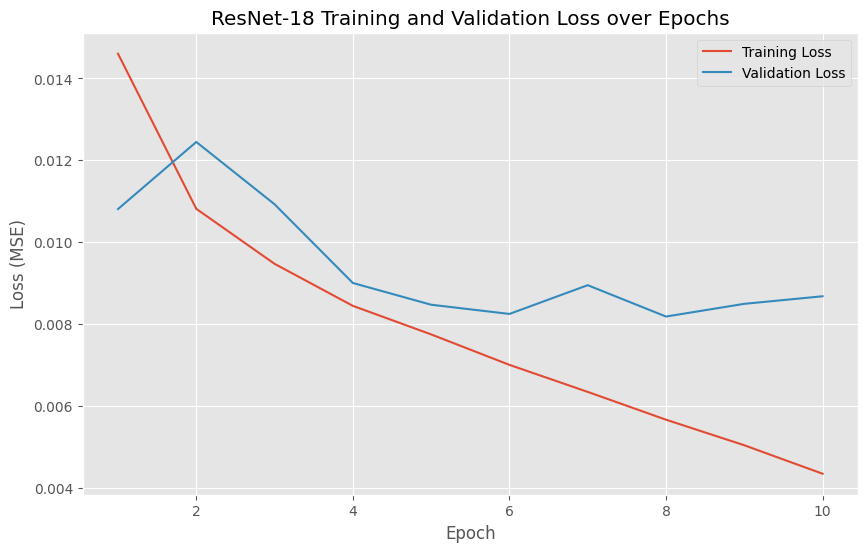

In [118]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), resnet_train_mse, label='Training Loss')
plt.plot(range(1, num_epochs + 1), resnet_val_mse, label='Validation Loss')
plt.title('ResNet-18 Training and Validation Loss over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss (MSE)')
plt.legend()
plt.grid(True)
plt.savefig('resnet18_training_validation_loss.pdf', format='pdf')
plt.show()

In [120]:
resnet_train_losses = np.sqrt(resnet_train_mse)
resnet_val_losses = np.sqrt(resnet_val_mse)

In [126]:
print(f"Validation RMSE (ResNet): {np.min(resnet_val_losses):.2f}")

Validation RMSE (ResNet): 0.09


In [130]:
import torch.optim.lr_scheduler as lr_scheduler


In [127]:
# 1. Adjust Data Transforms to Include Data Augmentation
# Overwrite data_transforms with new transforms including random rotation and flips
data_transforms = transforms.Compose([
    transforms.RandomRotation(degrees=(0, 360), fill=0),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# For the validation set, we typically don't apply data augmentation
val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [128]:
# 2. Create Datasets with the New Transforms
train_dataset = GalaxyDataset(
    image_dir='lab3_data/cropped_images',
    labels_df=train_df,
    transform=data_transforms
)

val_dataset = GalaxyDataset(
    image_dir='lab3_data/cropped_images',
    labels_df=val_df,
    transform=val_transforms
)

In [133]:
# 3. Create DataLoaders (reuse existing variables)
train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    num_workers=0
)

val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=0
)

In [134]:
# 4. Initialize Learning Rate Scheduler
scheduler = lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1)


In [136]:
# Number of labels (excluding 'GalaxyID')
num_labels = len(cl_names) - 1

# Load pre-trained ResNet-18 model
model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, num_labels)

# Move model to device
model.to(device)


/Users/vardaantekriwal/anaconda3/envs/gpCAM_env/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/vardaantekriwal/anaconda3/envs/gpCAM_env/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [137]:
# 5. Training and Validation Loops with Data Augmentation and Scheduler
num_epochs = 10  # Increase the number of epochs due to data augmentation

# Initialize lists to store loss values if not already initialized
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    print(f"Starting Epoch {epoch + 1}/{num_epochs}")
    model.train()
    running_loss = 0.0
    for batch_idx, (images, labels) in enumerate(train_loader):
        # Move data to device
        images = images.to(device)
        labels = labels.to(device)

        # Zero the parameter gradients
        optimizer.zero_grad()

        # Forward pass
        outputs = model(images)

        # Compute loss
        loss = criterion(outputs, labels)

        # Backward pass and optimize
        loss.backward()
        optimizer.step()

        # Accumulate loss
        running_loss += loss.item()

        # Optional: Print progress every 100 batches
        if (batch_idx + 1) % 100 == 0:
            print(f"Batch [{batch_idx + 1}/{len(train_loader)}], Loss: {loss.item():.4f}")

    # Update learning rate
    scheduler.step()

    # Compute average loss over the epoch
    epoch_loss = running_loss / len(train_loader)
    train_losses.append(epoch_loss)
    print(f"Epoch [{epoch + 1}/{num_epochs}] Training Loss: {epoch_loss:.4f}")

    # Validation phase
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for images, labels in val_loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)
    print(f"Epoch [{epoch + 1}/{num_epochs}] Validation Loss: {avg_val_loss:.4f}")

    # Save the model checkpoint
    checkpoint_path = f'resnet18_augmented_epoch_{epoch + 1}.pth'
    torch.save(model.state_dict(), checkpoint_path)
    print(f"Model saved to {checkpoint_path}\n")


Starting Epoch 1/10
Batch [100/6158], Loss: 0.4885
Batch [200/6158], Loss: 0.5291
Batch [300/6158], Loss: 0.5239
Batch [400/6158], Loss: 0.5296
Batch [500/6158], Loss: 0.5449
Batch [600/6158], Loss: 0.5461
Batch [700/6158], Loss: 0.5394
Batch [800/6158], Loss: 0.5247
Batch [900/6158], Loss: 0.5213
Batch [1000/6158], Loss: 0.4806
Batch [1100/6158], Loss: 0.5414
Batch [1200/6158], Loss: 0.5064
Batch [1300/6158], Loss: 0.4919
Batch [1400/6158], Loss: 0.5195
Batch [1500/6158], Loss: 0.5339
Batch [1600/6158], Loss: 0.5130
Batch [1700/6158], Loss: 0.5143
Batch [1800/6158], Loss: 0.5220
Batch [1900/6158], Loss: 0.5533
Batch [2000/6158], Loss: 0.5306
Batch [2100/6158], Loss: 0.5112
Batch [2200/6158], Loss: 0.5134
Batch [2300/6158], Loss: 0.5160
Batch [2400/6158], Loss: 0.5199
Batch [2500/6158], Loss: 0.4873
Batch [2600/6158], Loss: 0.4994
Batch [2700/6158], Loss: 0.4875
Batch [2800/6158], Loss: 0.4936
Batch [2900/6158], Loss: 0.4940
Batch [3000/6158], Loss: 0.5114
Batch [3100/6158], Loss: 0.54

In [143]:
val_losses

[0.6061998367503092,
 0.6389602502058078,
 0.6306023832071911,
 0.6129481192533072,
 0.6216773410509159,
 0.6246383023532954,
 0.6314710015987421,
 0.5934290074876376,
 0.6050489569058666,
 0.6238646412631134]

In [144]:
train_losses

[0.5171069910132138,
 0.5173192628407951,
 0.5173862363106246,
 0.5173222463349314,
 0.5171735708726696,
 0.5173058286769006,
 0.5170408786359488,
 0.5173227388959846,
 0.5174137462788334,
 0.5173695493282611]

In [145]:
val_losses_augmented = val_losses.copy()
train_losses_augmented = train_losses.copy()

In [147]:
val_losses_custom_cnn = val_losses  # Already RMSE
resnet_val_rmse = np.sqrt(resnet_val_mse)
val_losses_augmented_rmse = np.sqrt(val_losses_augmented)


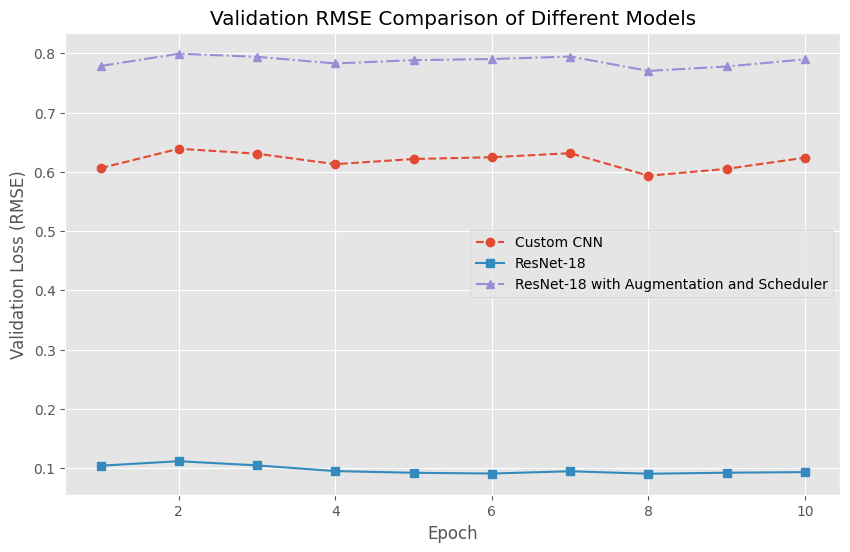

In [148]:
# Number of epochs
epochs = range(1, num_epochs + 1)

# Plotting
plt.figure(figsize=(10, 6))

plt.plot(epochs, val_losses_custom_cnn, label='Custom CNN', linestyle='--', marker='o')
plt.plot(epochs, resnet_val_rmse, label='ResNet-18', linestyle='-', marker='s')
plt.plot(epochs, val_losses_augmented_rmse, label='ResNet-18 with Augmentation and Scheduler', linestyle='-.', marker='^')

plt.title('Validation RMSE Comparison of Different Models')
plt.xlabel('Epoch')
plt.ylabel('Validation Loss (RMSE)')
plt.legend()
plt.grid(True)
plt.savefig('validation_loss_comparison.pdf', format='pdf')
plt.show()

In [155]:
import torch
from torchvision import models
import torch.nn as nn

# Number of labels (excluding 'GalaxyID')
num_labels = len(cl_names) - 1

# Initialize the ResNet-18 model
resnet_model = models.resnet18(pretrained=False)  # Set pretrained=False since we're loading our own weights
num_ftrs = resnet_model.fc.in_features
resnet_model.fc = nn.Linear(num_ftrs, num_labels)

# Load the trained model weights
checkpoint_path = 'resnet18_galaxy_epoch_10.pth'  # Update this path if needed
resnet_model.load_state_dict(torch.load(checkpoint_path))

# Move the model to the device (CPU or GPU)
resnet_model.to(device)

# Set the model to evaluation mode
resnet_model.eval()


/Users/vardaantekriwal/anaconda3/envs/gpCAM_env/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/vardaantekriwal/anaconda3/envs/gpCAM_env/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)
/var/folders/yb/gm3s7q8j7rjchq61y16sy76c0000gn/T/ipykernel_62678/2139837970.py:15: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for mor

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [156]:
from torchvision import transforms

# Validation data transforms (without augmentation)
val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize images to 224x224 pixels
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Use the same normalization as during training
                         std=[0.229, 0.224, 0.225])
])


In [157]:
# Assuming val_df is already defined (validation labels DataFrame)

# Define the GalaxyDataset for validation
val_dataset = GalaxyDataset(
    image_dir='lab3_data/cropped_images',
    labels_df=val_df,
    transform=val_transforms
)

# Create DataLoader for validation set
batch_size = 32  # Use the same batch size as during training
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    num_workers=0
)


In [152]:
import numpy as np

# Initialize lists to store predictions and true labels
all_preds = []
all_labels = []

# Disable gradient computation for inference
with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass to get predictions
        outputs = resnet_model(images)

        # If necessary, apply a sigmoid activation to constrain outputs between 0 and 1
        # outputs = torch.sigmoid(outputs)

        # Move tensors to CPU and convert to numpy arrays
        preds = outputs.cpu().numpy()
        true_labels = labels.cpu().numpy()

        # Append to the lists
        all_preds.append(preds)
        all_labels.append(true_labels)

# Concatenate all batches
all_preds = np.vstack(all_preds)
all_labels = np.vstack(all_labels)


In [165]:
# 3. Make Predictions on the Validation Set
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in val_loader:
        images = images.to(device)
        labels = labels.to(device)

        # Forward pass to get predictions
        outputs = resnet_model(images)

        # Apply sigmoid activation
        outputs = torch.sigmoid(outputs)

        # Move tensors to CPU and convert to numpy arrays
        preds = outputs.cpu().numpy()
        true_labels = labels.cpu().numpy()

        # Append to the lists
        all_preds.append(preds)
        all_labels.append(true_labels)

# Concatenate all batches
all_preds = np.vstack(all_preds)
all_labels = np.vstack(all_labels)

# Print shapes and sample values
print(f"all_preds shape: {all_preds.shape}")
print(f"all_labels shape: {all_labels.shape}")
print("Sample predictions:", all_preds[:5])
print("Sample true labels:", all_labels[:5])


all_preds shape: (12316, 37)
all_labels shape: (12316, 37)
Sample predictions: [[0.5214773  0.71350884 0.5041222  0.53239214 0.6877501  0.5669778
  0.62673056 0.6609722  0.52993125 0.5085653  0.58636326 0.5898756
  0.50973064 0.6960429  0.5452799  0.49982423 0.5097193  0.51062626
  0.4944445  0.5038472  0.5225783  0.53387487 0.5586273  0.59470487
  0.4953471  0.5258591  0.49861974 0.5083988  0.51060873 0.5404658
  0.6138352  0.5478307  0.6229847  0.49567926 0.49738204 0.50189054
  0.49619856]
 [0.6314167  0.60589284 0.5076863  0.5048225  0.60167843 0.50700843
  0.5952365  0.51527613 0.5873653  0.50032717 0.52507854 0.56330776
  0.5140182  0.53663635 0.70080143 0.5912744  0.5424062  0.5004553
  0.50344205 0.5016877  0.5052428  0.5082806  0.5112537  0.50515413
  0.49860266 0.5051622  0.49967    0.5002621  0.50692844 0.5026783
  0.5059961  0.50207055 0.5021653  0.50108933 0.5009858  0.50145924
  0.50748336]
 [0.59376514 0.64875615 0.50226945 0.597537   0.55521816 0.50983876
  0.54746085 0

In [159]:
outputs = torch.sigmoid(outputs)


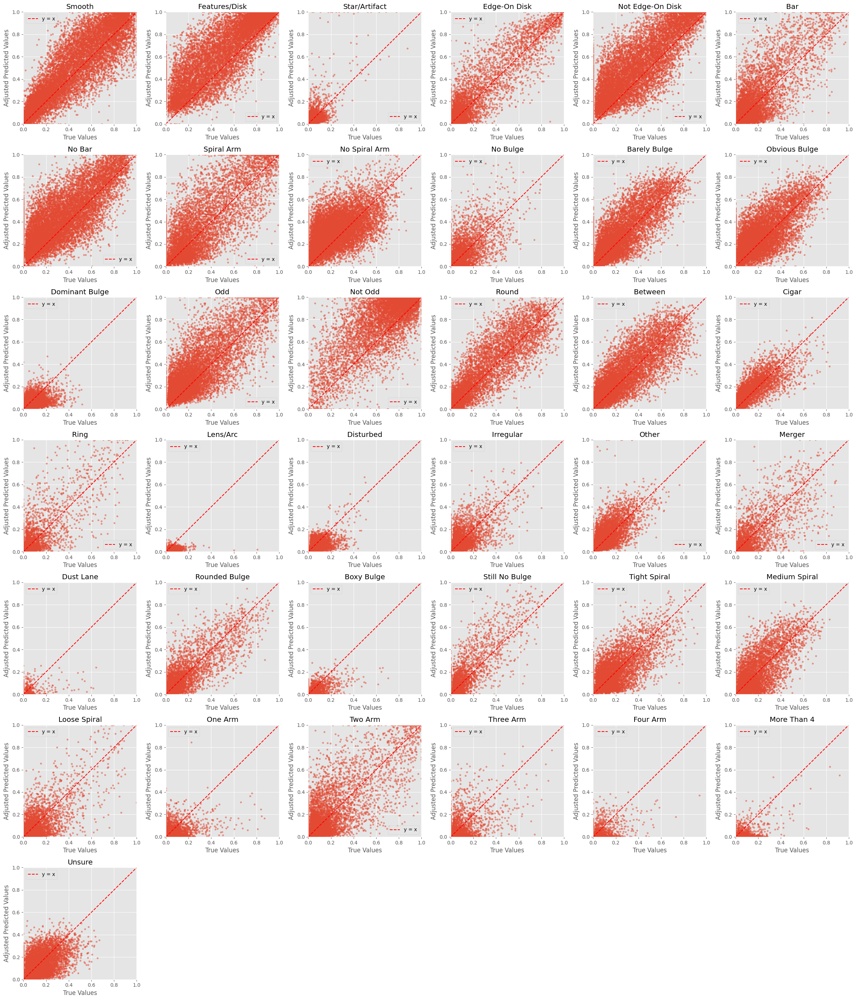

In [171]:
adjusted_preds = 5 * all_preds - 2.5

# Ensure values are within [0, 1]
adjusted_preds = np.clip(adjusted_preds, 0, 1)

num_labels = all_labels.shape[1]
num_cols = 6
num_rows = (num_labels + num_cols - 1) // num_cols

fig, axes = plt.subplots(num_rows, num_cols, figsize=(24, num_rows * 4))
axes = axes.flatten()

for i in range(num_labels):
    ax = axes[i]
    ax.scatter(all_labels[:, i], adjusted_preds[:, i], alpha=0.5, s=10)
    ax.set_xlim([0, 1])
    ax.set_ylim([0, 1])
    ax.plot([0, 1], [0, 1], 'r--', label='y = x')
    ax.set_title(cl_names[i + 1])  # Skip 'GalaxyID'
    ax.set_xlabel('True Values')
    ax.set_ylabel('Adjusted Predicted Values')
    ax.legend()

# Remove any unused subplots
for i in range(num_labels, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()
